# Data Visual 9 – Pre-University Enrolment

## Step 1 - Import Libraries

In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import mysql.connector

## Step 2 - Connect to SQL Database and Retrieve Data Table

In [2]:
# Database connection configuration
db_config = {
    'user': 'weaver',  
    'password': 'web101SG',  
    'host': 'localhost',
    'database': 'dbsingaporepoly',  
}

# Establish a connection to the database
conn = mysql.connector.connect(**db_config)

# Query to load the processed data from the MySQL table
query = "SELECT * FROM enrolmentpreuniversitybylevelandcourse_processed"

# Load the data into a pandas DataFrame
enrolment_data = pd.read_sql(query, conn)

# Close the database connection
conn.close()

C:\Users\wrait\AppData\Local\Temp\ipykernel_33024\2572787796.py:16: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  enrolment_data = pd.read_sql(query, conn)


## Step 3 - Setup Variables

In [3]:
# List of unique years
years = enrolment_data['year'].unique()

## Step 4 - Plot the bar charts - for Enrolment

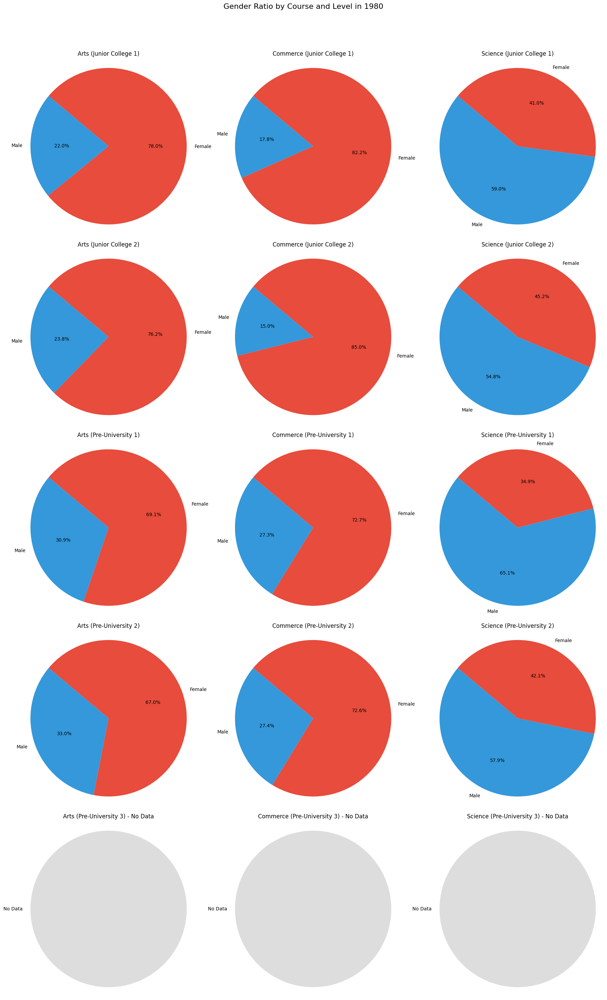

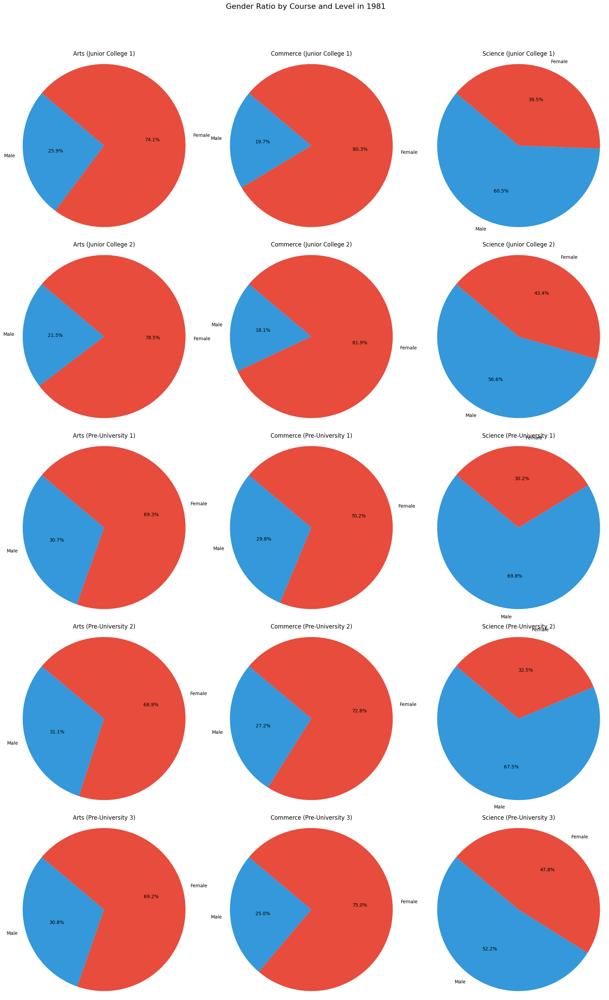

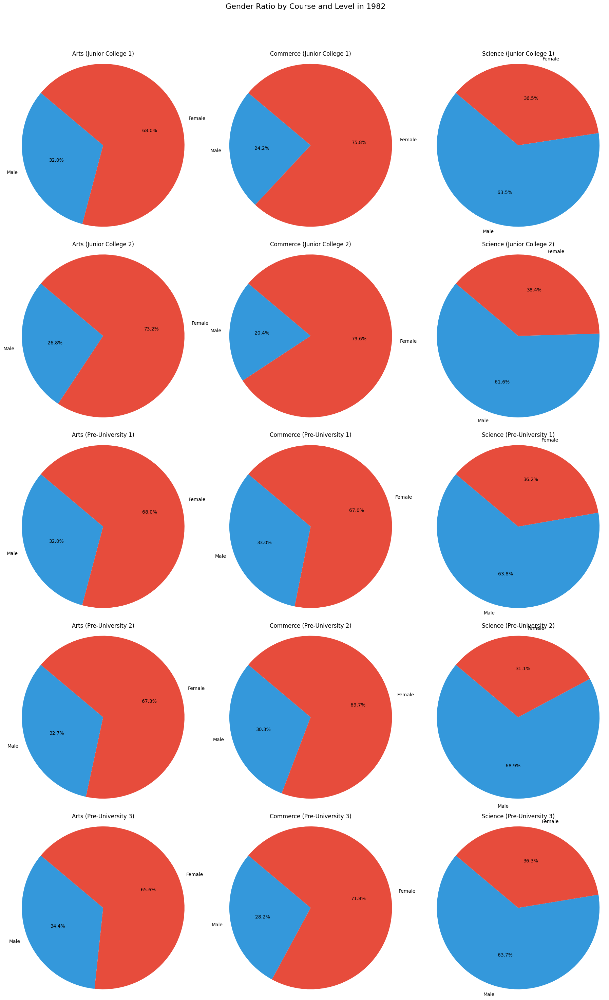

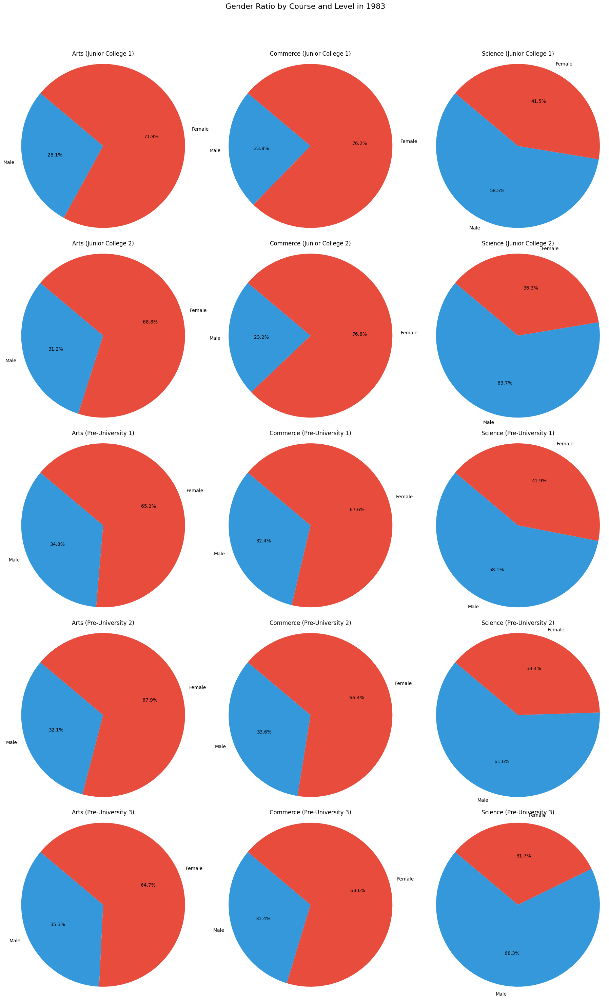

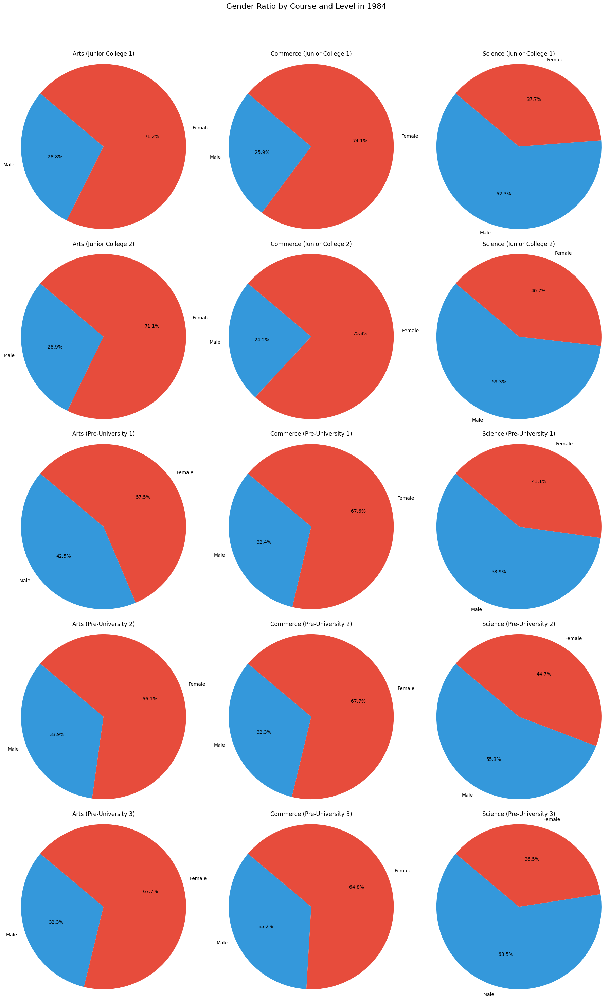

...

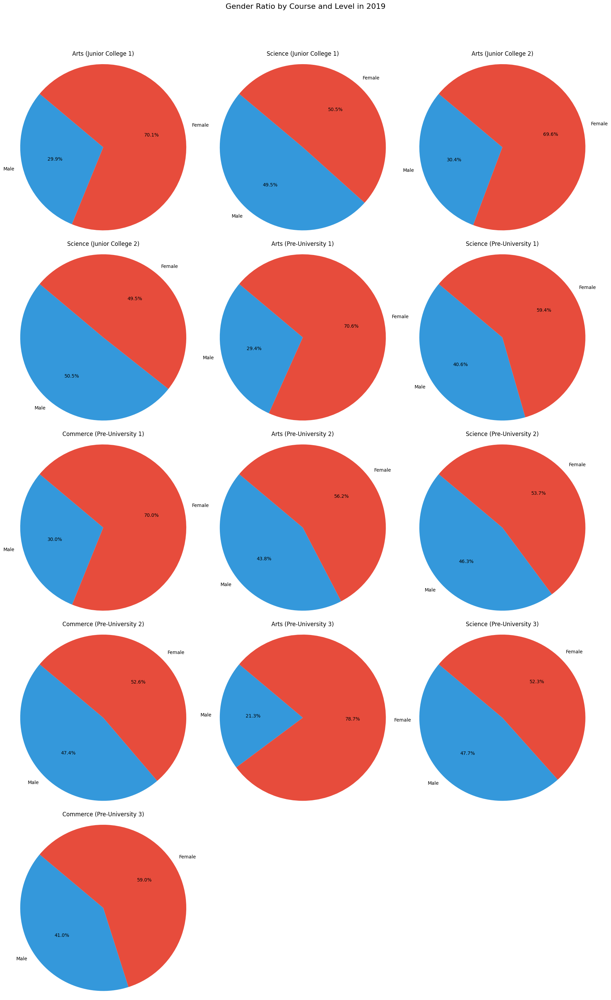

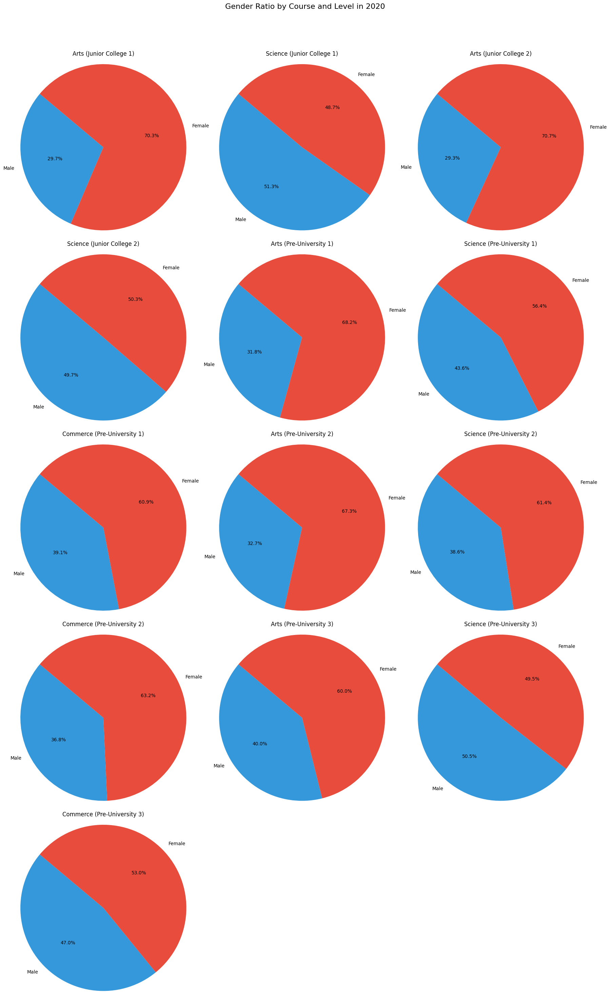

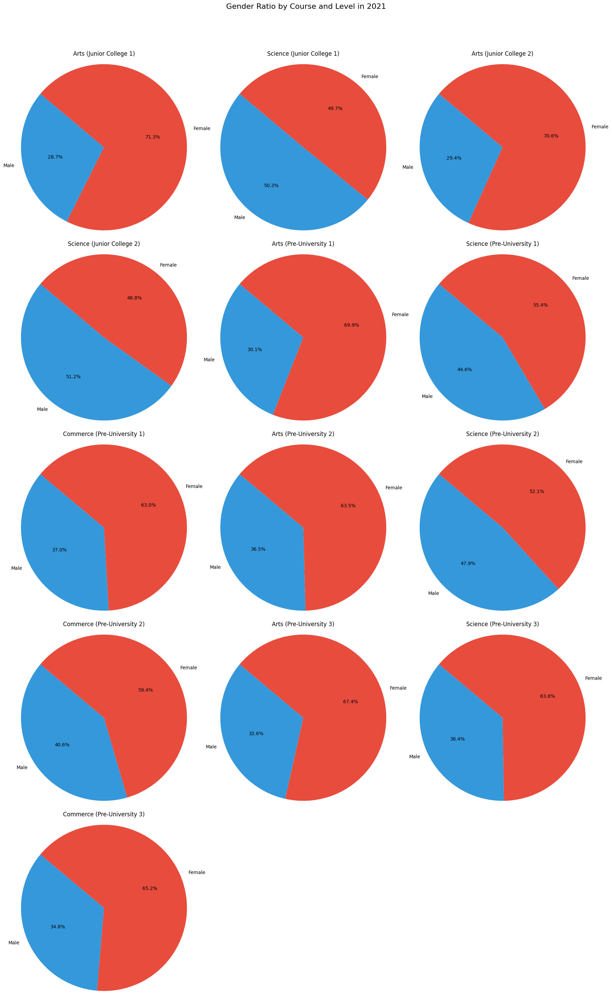

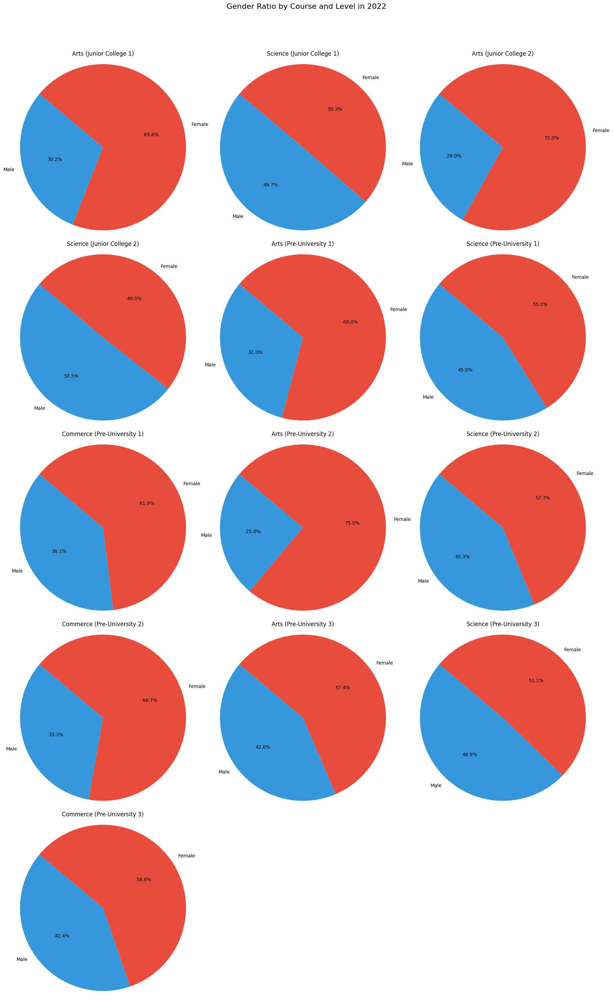

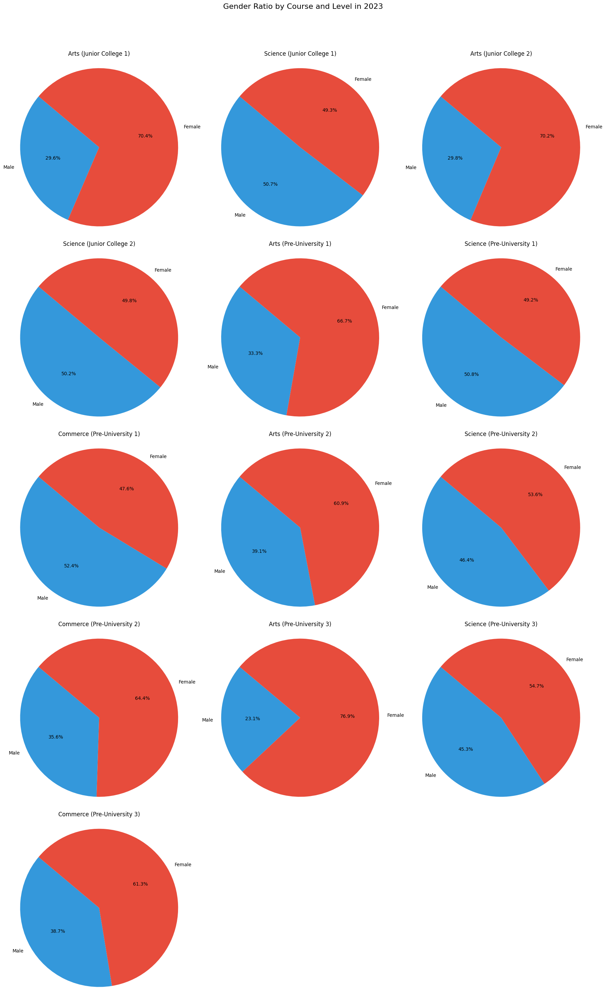

In [4]:
# Iterate over each year to create pie charts for each level-course combination
for year in years:
    # Filter data for the specific year
    data_year = enrolment_data[enrolment_data['year'] == year]

    # Determine the number of charts required (one for each level-course combination)
    unique_combinations = data_year[['level', 'course']].drop_duplicates()
    num_charts = len(unique_combinations)
    
    num_cols = 3  
    num_rows = (num_charts + num_cols - 1) // num_cols  
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(18, 6 * num_rows))
    fig.suptitle(f'Gender Ratio by Course and Level in {year}', fontsize=16)
    axes = axes.flatten() 

    for i, (level, course) in enumerate(unique_combinations.values):
        # Filter data for the specific level-course combination
        data_combination = data_year[(data_year['level'] == level) & (data_year['course'] == course)]

        # Convert enrolment_preu to numeric, coercing errors into NaNs
        data_combination.loc[:, 'enrolment_preu'] = pd.to_numeric(data_combination['enrolment_preu'], errors='coerce')

        # Get the total male and female enrolment
        male_enrolment = data_combination[data_combination['sex'] == 'M']['enrolment_preu'].sum()
        female_enrolment = data_combination[data_combination['sex'] == 'F']['enrolment_preu'].sum()

        if male_enrolment > 0 or female_enrolment > 0:
            sizes = [male_enrolment, female_enrolment]
            labels = ['Male', 'Female']
            colors = ['#3498db', '#e74c3c']  # Blue for males, Red for females
            axes[i].pie(sizes, labels=labels, autopct='%1.1f%%', startangle=140, colors=colors)
            axes[i].set_title(f'{course} ({level})')
        else:
            axes[i].pie([1], labels=['No Data'], colors=['#dddddd'])
            axes[i].set_title(f'{course} ({level}) - No Data')
        
        axes[i].axis('equal')

    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()